In [1]:
using Catalyst, DifferentialEquations, Plots, Latexify

# SINGLE GENE NO FEEDBACK

In [2]:
kepler = @reaction_network begin
    δ, m --> ∅
    α0, ∅ --> m
    α1, ∅ --> m
    (K*k0), O0--> O1
    (K*k1), O1--> O0
end δ α0 α1 K k0 k1

Model ##ReactionSystem#257 with 5 equations
States (3):
  m(t)
  O0(t)
  O1(t)
Parameters (6):
  δ
  α0
  α1
  K
  k0
  k1

In [3]:
odesys = convert(ODESystem, kepler)

Model ##ReactionSystem#257 with 3 equations
States (3):
  m(t)
  O0(t)
  O1(t)
Parameters (6):
  δ
  α0
  α1
  K
  k0
  k1

In [4]:
speciesmap(kepler)

Dict{Term{Real, Base.ImmutableDict{DataType, Any}}, Int64} with 3 entries:
  m(t)  => 1
  O1(t) => 3
  O0(t) => 2

In [5]:
paramsmap(kepler)

Dict{Sym{Real, Base.ImmutableDict{DataType, Any}}, Int64} with 6 entries:
  α0 => 2
  K  => 4
  δ  => 1
  k1 => 6
  α1 => 3
  k0 => 5

In [6]:
p = (.5, 40., 2., log(2)/120, 5e-3,.3)

u₀ = [10.,30.,50.]

tspan = (0., 10000.)

oprob = ODEProblem(kepler, u₀, tspan, p)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 10000.0)
u0: 3-element Vector{Float64}:
 10.0
 30.0
 50.0

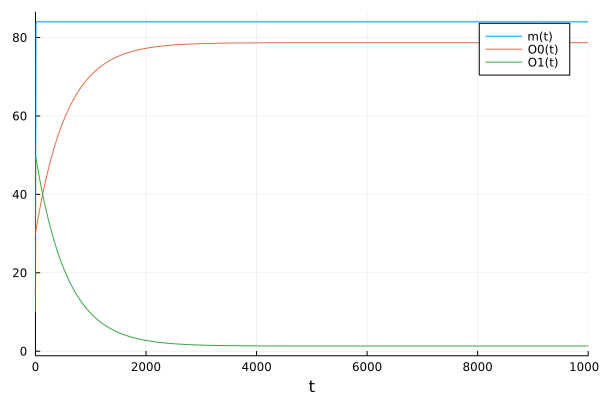

In [7]:
sol = solve(oprob, Tsit5(), saveat=10.)
plot(sol)

In [25]:
plot(sol, vars=[1,2,3], seriestype = :histogram)

In [8]:
dprob = DiscreteProblem(kepler, u₀ , tspan , p)
jprob = JumpProblem(kepler, dprob, Direct(), save_positions = (false,false))

sol2 = solve(jprob , SSAStepper(), saveat=10.)
plot(sol2)

In [9]:
odefun = ODEFunction(convert(ODESystem,kepler),jac=true)
F = (u₀,p) -> odefun(u₀,p,0)      
J = (u₀,p) -> odefun.jac(u₀,p,0)

#3 (generic function with 1 method)

In [10]:
p_idx = 1
p_span = (0.1,20.)
plot_var_idx = 1

1

In [11]:
#using BifurcationKit, Plots, LinearAlgebra, Setfield

In [12]:
#opts = ContinuationPar( dsmax = 0.05, dsmin = 0.001, ds = 0.001, maxSteps = 100000, pMin = p_span[1], pMax = p_span[2], detectBifurcation = 3, newtonOptions = NewtonPar(tol = 1e-9, verbose = false, maxIter =15))

In [13]:
#DO = DeflationOperator(2.0, dot, 1. , [fill(0.,length(kepler.states))]);

In [14]:
#params_input = setindex!(p, p_span[1], p_idx)
#p = Vector(p)
#p[1] = p_span[1]
#branches, = continuation(F,J, params_input, (@lens _[p_idx]) , opts, DO , verbosity = 0, showplot = false, printSolution =(x,p) -> x[plot_var_idx], perturbSolution = (x,p,id) -> (x .+ 0.8 .* rand(length(x))),callbackN = (x, f, J, res, iteration, itlinear, options; kwargs...) -> res<1e7)

In [15]:
#branches, = continuation(F, J, p, (@lens _[p_idx]), opts , DO,             
#    verbosity = 0, showplot=true,                                                   
#    printSolution=(x, p) -> x[plot_var_idx])

    #perturbSolution = (x,p,id) -> (x  .+ 0.8 .* rand(length(x))),                     
    #callbackN = (x, F, J, res, iteration, itlinear, options; kwargs...) -> res <1e7)